# 23: Simulation based calibration and related checks in practice

[Data set download](https://s3.amazonaws.com/bebi103.caltech.edu/data/singer_transcript_counts.csv)

<hr>

In [1]:
# Colab setup ------------------
import os, sys, subprocess
if "google.colab" in sys.modules:
    cmd = "pip install --upgrade colorcet bebi103 arviz cmdstanpy watermark"
    process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    stdout, stderr = process.communicate()
    import cmdstanpy; cmdstanpy.install_cmdstan()
    data_path = "https://s3.amazonaws.com/bebi103.caltech.edu/data/"
else:
    data_path = "../data/"
# ------------------------------

/Users/bois/opt/anaconda3/lib/python3.9/site-packages/colorcet/__init__.py:74: UserWarning: Trying to register the cmap 'cet_gray' which already exists.
  register_cmap("cet_"+name, cmap=cm[name])
/Users/bois/opt/anaconda3/lib/python3.9/site-packages/colorcet/__init__.py:74: UserWarning: Trying to register the cmap 'cet_gray_r' which already exists.
  register_cmap("cet_"+name, cmap=cm[name])


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
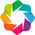

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
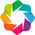

Loading BokehJS ...

In [2]:
import numpy as np
import pandas as pd
import scipy.stats as st

import cmdstanpy
import arviz as az

import iqplot

import bebi103

import holoviews as hv
hv.extension('bokeh')
bebi103.hv.set_defaults()

import bokeh.io
import bokeh.plotting
bokeh.io.output_notebook()

<hr>

You should set the value of the variable `cores` to be the number of cores you have available on your machine. I will be using 3 cores in this notebook, since I have four cores on my desktop computer, reserving one core other work.

In [3]:
cores = 3

<hr>

In [the previous lesson](../22/sbc.ipynb), we laid out the a principled pipeline for constructing and testing a generative model and associated inference procedures. In this lesson, we work through the implementation of the principled pipeline on a familiar data set. We will again look at the RNA FISH data set from [this paper from the Elowitz lab](https://doi.org/10.1016/j.molcel.2014.06.029). You can download the data set [here](https://s3.amazonaws.com/bebi103.caltech.edu/data/singer_transcript_counts.csv). If you want to refresh yourself about this data set, you can read its description in [a previous lesson](../09/parameter_estimation_with_mcmc.ipynb).

## ECDFs of mRNA counts

Let's go ahead and load the data. In our analysis here, we will use the Rest gene.

In [4]:
# Load DataFrame
df = pd.read_csv(os.path.join(data_path, 'singer_transcript_counts.csv'), comment='#')

# Pull out data for Stan
n = df['Rest'].values
data = dict(N=len(n), n=n)

# Take a look
bokeh.io.show(iqplot.ecdf(n, x_axis_label='mRNA count'))

## The generative model

When [we first used MCMC with this data set](../09/parameter_estimation_with_mcmc.ipynb), we used a Negative Binomial likelihood (which has both a theoretical and empirical justification), parametrized by the burst size $b$ and the burst frequency $\alpha$. We had the following generative model.

\begin{align}
&\log_{10} \alpha \sim \text{Norm}(0, 1),\\[1em]
&\log_{10} b \sim \text{Norm}(2, 1),\\[1em]
&\beta = 1/b,\\[1em]
&n_i \sim \text{NegBinom}(\alpha, \beta) \;\forall i.
\end{align}

We can code up prior predictive checks and the model in Stan. First, the prior predictive checks.

```stan
data {
  int N;
}


generated quantities {
  int n[N];

  real log10_alpha = normal_rng(0.0, 1.0);
  real log10_b = normal_rng(2.0, 1.0);
  real alpha = 10^log10_alpha;
  real b = 10^log10_b;
  real beta_ = 1 / b;

  for (i in 1:N) {
    n[i] = neg_binomial_rng(alpha, beta_);
  }
}
```

And also the model.

```
data {
  int N;
  int n[N];
}


parameters {
  real<lower=0> log10_alpha;
  real<lower=0> log10_b;
}


transformed parameters {
  real alpha = 10^log10_alpha;
  real b = 10^log10_b;
  real beta_ = 1.0 / b;
}


model {
  // Priors
  log10_alpha ~ normal(0.0, 1.0);
  log10_b ~ normal(2.0, 1.0);

  // Likelihood
  n ~ neg_binomial(alpha, beta_);
}
```

For now, we are not going to bother with posterior predictive checks or computing the log likelihood.

Let's compile the models.

In [5]:
sm_prior_pred = cmdstanpy.CmdStanModel(stan_file='prior_pred.stan')
sm = cmdstanpy.CmdStanModel(stan_file='model.stan')

INFO:cmdstanpy:compiling stan file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/prior_pred.stan to exe file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/prior_pred
INFO:cmdstanpy:compiled model executable: /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/prior_pred
INFO:cmdstanpy:compiling stan file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/model.stan to exe file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/model
INFO:cmdstanpy:compiled model executable: /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/model


We can now perform prior predictive checks. We will plot the resulting checks as ECDFs so we can see how the mRNA counts are distributed. For the plot, to avoid choking the browser, we will only plot 100 ECDFS.

In [6]:
samples_prior_pred = sm_prior_pred.sample(
    data=data, fixed_param=True, iter_sampling=1000
)

samples_prior_pred = az.from_cmdstanpy(
    posterior=samples_prior_pred, prior=samples_prior_pred, prior_predictive="n"
)

p = None
for n in samples_prior_pred.prior_predictive.n.squeeze()[::10]:
    p = iqplot.ecdf(
        n, marker_kwargs=dict(fill_alpha=0.2, line_alpha=0.2), p=p, x_axis_type="log"
    )
    
p.x_range = bokeh.models.Range1d(0.3, 3e5)

bokeh.io.show(p)

INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.


We can also plot the mean and variance of all of the generated data sets as to further characterize the prior predictive distribution.

In [7]:
means = samples_prior_pred.prior_predictive.n.squeeze().mean(axis=1).values
variances = samples_prior_pred.prior_predictive.n.squeeze().var(axis=1).values

hv.Points(
    data=(means, variances),
    kdims=['mean of counts', 'variance of counts'],
).opts(
    logx=True,
    logy=True,
    size=2,
    xlim=(1, None),
    ylim=(1, None)
)

:Points   [mean of counts,variance of counts]

This also makes sense. We get Poissonian behavior (mean = variance) for some samples, and then a range of dispersion beyond that.

The prior predictive checks show a wide range of mRNA counts, and all seem reasonable. We do get some large number of counts, upwards of 10,000, considering that the [typical total mRNA count in a mammalian cell is about 100,000](http://book.bionumbers.org/how-many-mrnas-are-in-a-cell/). But this is not dominant, and we get good coverage over what we might expect, so this seems like a pretty good prior.

## Performing SBC

Performing SBC really only requires a few ingredients. First, we need the requisite data to be used for prior predictive checks. In this case, it is just the number of measurements we are making, $N$. Second, we need a Stan model to generate the prior predictive data sets. Finally, we need a Stan model to sample out of the posterior. The `bebi103.stan.sbc()` function will then perform SBC and give the results back in a data frame. That is, it will draw a prior predictive data set, use that data set in a posterior sampling by MCMC calculation, and then compute the useful diagnostics and statistics (z-score, shrinkage, and rank statistic) from those samples. It does this `N` times (not to be confused with $N$, the number of measurements in the experiment). Let's now put it to use to perform SBC.

In [8]:
df_sbc = bebi103.stan.sbc(
    prior_predictive_model=sm_prior_pred,
    posterior_model=sm,
    prior_predictive_model_data=data,
    posterior_model_data=data,
    measured_data=["n"],
    var_names=["alpha", "b"],
    measured_data_dtypes=dict(n=int),
    cores=cores,
    N=1000,
    progress_bar=True,
)

100%|████████████████████████████████████████████████████████████████████| 1000/1000 [14:34<00:00,  1.14it/s]


The `bebi103.stan.sbc()` function gives a data frame with the SBC analysis results. Let's take a look at the data frame to see what it has.

In [9]:
df_sbc.head()

,ground_truth,rank_statistic,mean,sd,shrinkage,z_score,Rhat,ESS,ESS_per_iter,tail_ESS,tail_ESS_per_iter,n_divergences,n_bad_ebfmi,n_max_treedepth,warning_code,L,trial,parameter
0,0.108601,0,1.002043,0.002082,1.0,429.031041,1.002043,1773.481452,0.443370,1107.747745,0.276937,0,0,0,0,4000,0,alpha
1,0.071546,0,1.001326,0.001340,1.0,693.701169,1.001166,1830.202638,0.457551,1397.193289,0.349298,0,0,0,0,4000,1,alpha
2,0.975629,0,1.075526,0.053720,1.0,1.859612,1.002323,932.060992,0.233015,1126.147815,0.281537,8,0,0,4,4000,2,alpha
3,0.418858,0,1.004797,0.004863,1.0,120.493606,1.001466,1553.992823,0.388498,999.240489,0.249810,0,0,0,0,4000,3,alpha
4,0.900509,0,1.069896,0.061887,1.0,2.737034,1.004417,700.365300,0.175091,824.228330,0.206057,14,0,0,4,4000,4,alpha


For each trial, for each parameter, we get diagnostic results, z-scores, shrinkage, rank statistic, posterior mean and standard deviations for each ground truth, as well as the ground truth used in the posterior sampling. The `warning_code` column gives a succinct summary of the diagnostic warnings. You can parse a warning code using the `bebi103.stan.parse_warning_code()` function. As an example, I'll test it on warning code 14.

In [10]:
bebi103.stan.parse_warning_code(14)

Rhat warning
divergence warning
treedepth warning


To visualize the results of SBC, we can first make a plot of the z-scores and of shrinkage. Ideally, the shrinkage should all be close to one, and the magnitude of the z-scores should all be less than five. Let's take a look!

In [11]:
points = hv.Points(
    data=df_sbc,
    kdims=['shrinkage', ('z_score', 'z-score')],
    vdims=['parameter', 'trial']
).groupby(
    'parameter'
).opts(
    tools=['hover'],
    size=2
).overlay(
)

points

:NdOverlay   [parameter]
   :Points   [shrinkage,z_score]   (parameter,trial)

Oof! We are severely overfitting the model, as evidenced by z-scores of very large magnitude. We are missing the ground truth.

To diagnose why, let's look at which samples have reasonable z-scores. We'll make a strip plot categorizing the results of SBC by parameter and whether or not the z-score is good.

In [12]:
df_sbc['good_z'] = np.abs(df_sbc['z_score']) < 5
p = iqplot.strip(
    df_sbc,
    cats=['parameter', 'good_z'],
    color_column='good_z',
    order=(('alpha', True), ('alpha', False), ('b', True), ('b', False)), 
    q='ground_truth',
    x_axis_type='log',
    jitter=True
)

bokeh.io.show(p)

Most strikingly, the z-score is poor for $\alpha < 1$. Recall that for a Negative Binomial distribution, the mean is $\alpha b$. So, when $\alpha$ is small, the mean can be less than one, meaning that most of the counts generated by the model are zero. It makes sense, then, that we will miss the ground truth, since the data are almost all zero; there is nothing to properly inform the posterior.

This immediately identifies a possible problem with our inference pipeline. If a data set comes through with mostly zero measurements, we will not be able to make reliable inferences. SBC has thus identified a problem area look out for when doing our inference.

Having a typical burst size less than one is actually unphysical, since no transcripts are created. To be "on," we would need to make at least one transcript. So, the SBC has exposed a problem in our modeling that we didn't see before. Not only can the data fail to inform the prior for these parameter values, we have also discovered that our model can give unphysical parameter values. We will abort continued analysis of our SBC results and instead adapt our model.

### An adjusted prior

I would expect the time between bursts to be of order minutes, since that is a typical response time to signaling of a cell. This is of the same order of magnitude of an RNA lifetime, so I might then expect $\alpha$ to be of order unity.

\begin{align}
\alpha \sim \text{Gamma}(1.25, 0.1).
\end{align}

We can make a quick plot.

In [13]:
alpha = np.linspace(0, 50, 200)
g = st.gamma.pdf(alpha, 1.25, loc=0, scale=1/0.1)
hv.Curve(
    (alpha, g),
    kdims='α',
    vdims='g(α)'
)

:Curve   [α]   (g(α))

This is still pretty broad and pushes some of the prior probability mass away from zero.

Turning now to the burst size, I would expect $b$ to depend on promoter strength and/or strength of transcriptional activators. I could imagine anywhere from a few to several thousand transcripts per burst.

\begin{align}
b \sim \text{Gamma}(2, 0.002).
\end{align}

Again, with a plot.

In [14]:
b = np.linspace(0, 5000, 200)
g = st.gamma.pdf(b, 2, loc=0, scale=1/0.002)
hv.Curve(
    (b, g),
    kdims='b',
    vdims='g(b)'
)

:Curve   [b]   (g(b))

This prior moves $b$ off of zero, which we saw was problematic in our previous prior. The Gamma prior also decays faster than our original Log-Normal prior, which ended up getting us very large burst sizes. We then have the following model.

\begin{align}
&\alpha \sim \text{Gamma}(1.25, 0.1), \\[1em]
&b \sim \text{Gamma}(2, 0.002), \\[1em]
&\beta = 1/b,\\[1em]
&n_i \sim \text{NegBinom}(\alpha, \beta) \;\forall i.
\end{align}

We can code this model up and check the prior predictive checks. The Stan code is as follows.

```stan
data {
  int N;
}


generated quantities {
  int n[N];

  real alpha = gamma_rng(1.25, 0.1);
  real b = gamma_rng(2.0, 0.002);
  real beta_ = 1.0 / b;
  
  for (i in 1:N) {
    n[i] = neg_binomial_rng(alpha, beta_);
  }
}
```

Let's get some samples and look at the ECDFs of the copy numbers again.

In [15]:
sm_prior_pred_2 = cmdstanpy.CmdStanModel(stan_file='prior_pred_2.stan')
samples_prior_pred = sm_prior_pred_2.sample(
    data=data, fixed_param=True, iter_sampling=1000
)

samples_prior_pred = az.from_cmdstanpy(
    posterior=samples_prior_pred, prior=samples_prior_pred, prior_predictive="n"
)

p = None
for n in samples_prior_pred.prior_predictive.n.squeeze()[::10]:
    p = iqplot.ecdf(
        n, marker_kwargs=dict(fill_alpha=0.2, line_alpha=0.2), p=p, x_axis_type="log",
        x_range=[0.3, 1e6]
    )

bokeh.io.show(p)

INFO:cmdstanpy:compiling stan file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/prior_pred_2.stan to exe file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/prior_pred_2
INFO:cmdstanpy:compiled model executable: /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/prior_pred_2
INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.


Most of the data sets have reasonable ECDFs. Importantly, we see that the most number of zeros we get in any one data set is about 30% or so of the counts. These data sets again seem to match our intuition. Let's check the mean and variance of transcript counts.

In [16]:
means = samples_prior_pred.prior_predictive.n.squeeze().mean(axis=1).values
variances = samples_prior_pred.prior_predictive.n.squeeze().var(axis=1).values

hv.Points(
    data=(means, variances),
    kdims=['mean of counts', 'variance of counts'],
).opts(
    logx=True,
    logy=True,
    size=2,
    xlim=(1, None),
    ylim=(1, None)
)

:Points   [mean of counts,variance of counts]

This looks good. We can now code up the Stan model and run SBC on this, hopefully improved, model. We will now include posterior predictive checks because we will ultimately use this model. The Stan code is as follows.

```stan
data {
  int N;
  int n[N];
}


parameters {
  real<lower=0> alpha;
  real<lower=0> b;
}


transformed parameters {
  real beta_ = 1.0 / b;
}


model {
  // Priors
  alpha ~ gamma(2.0, 0.25);
  b ~ gamma(2.0, 0.05);

  // Likelihood
  n ~ neg_binomial(alpha, beta_);
}


generated quantities {
  int n_ppc[N];
  for (i in 1:N) {
    n_ppc[i] = neg_binomial_rng(alpha, beta_);
  }
}
```

Let's compile!

In [17]:
sm_2 = cmdstanpy.CmdStanModel(stan_file='model_2.stan')

INFO:cmdstanpy:compiling stan file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/model_2.stan to exe file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/model_2
INFO:cmdstanpy:compiled model executable: /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/23/model_2


And now we can conduct SBC with this updated model. Because we have posterior predictive checks, we need to make sure to tell `bebi103.stan.sbc()` which variables are posterior predictive (or log likelihood, though we do not have that in this model).

In [18]:
df_sbc = bebi103.stan.sbc(
    prior_predictive_model=sm_prior_pred_2,
    posterior_model=sm_2,
    prior_predictive_model_data=data,
    posterior_model_data=data,
    measured_data=["n"],
    var_names=["alpha", "b"],
    measured_data_dtypes=dict(n=int),
    posterior_predictive_var_names=["n_ppc"],
    cores=cores,
    N=1000,
    progress_bar=True,
)

100%|████████████████████████████████████████████████████████████████████| 1000/1000 [22:24<00:00,  1.34s/it]


This time, let's check the diagnostics first. We can get the count of each warning type.

In [19]:
# Divide by two because diagnostics are listed for each parameter
df_sbc.groupby('warning_code').size() / 2

warning_code
0    902.0
1     10.0
2     86.0
3      2.0
dtype: float64

We have two warning types, type 1 (ESS warning) and type 2 (Rhat warning). (A type 3 warning is both Rhat and ESS.) To deal with these, we can increase the number of iterations we take. Note that this is an important feature of performing these SBC calculations; we can see what kinds of difficulties we might encounter in our sampling.

In [20]:
df_sbc = bebi103.stan.sbc(
    prior_predictive_model=sm_prior_pred_2,
    posterior_model=sm_2,
    prior_predictive_model_data=data,
    posterior_model_data=data,
    measured_data=["n"],
    var_names=["alpha", "b"],
    measured_data_dtypes=dict(n=int),
    posterior_predictive_var_names=['n_ppc'],
    sampling_kwargs=dict(iter_warmup=2000, iter_sampling=2000),
    cores=cores,
    N=1000,
    progress_bar=True,
)

100%|████████████████████████████████████████████████████████████████████| 1000/1000 [40:12<00:00,  2.41s/it]


Let's again check the diagnostics.

In [21]:
df_sbc.groupby('warning_code').size() / 2

warning_code
0    997.0
2      3.0
dtype: float64

Our diagnostics are much better! Now, let's make a plot of the z-score versus shrinkage.

In [22]:
hv.Points(
    data=df_sbc,
    kdims=['shrinkage', ('z_score', 'z-score')]
).groupby(
    'parameter'
).opts(
    size=2
).overlay(
)

:NdOverlay   [parameter]
   :Points   [shrinkage,z_score]   (ground_truth,rank_statistic,mean,sd,Rhat,ESS,ESS_per_iter,tail_ESS,tail_ESS_per_iter,n_divergences,n_bad_ebfmi,n_max_treedepth,warning_code,L,trial,parameter)

We have good z-scores for all trials, and decent shrinkage. This all looks good. Let's now do the self-consistency check with the rank statistic. Recall that the rank statistics should be Uniformly distributed. Therefore, the ECDFs of the rank statistics should fall on a diagonal line. When we plot the ECDF, we can also plot an envelope which encompasses the 99% confidence interval for the ECDF of a Uniformly distributed random variable.

In [23]:
bokeh.io.show(bebi103.viz.sbc_rank_ecdf(df_sbc, diff=False))

It looks like the rank statistic is Uniformly distributed. We can see this more clearly if we instead plot the difference of the ECDF to the theoretical ECDF of a Uniformly distributed random variable.

In [24]:
bokeh.io.show(bebi103.viz.sbc_rank_ecdf(df_sbc))

In this clearer view, we see that most of the rank statistics all live within the 99% envelope, so we are in good shape.

With everything checking out, we can perform our sampling with real data!

## Sampling with our new model

We'll now use our model with updated priors to perform parameter estimation using our real data set, checking all diagnostics after the fact, of course.

In [25]:
samples = sm_2.sample(data=data)
samples = az.from_cmdstanpy(posterior=samples, posterior_predictive='n_ppc')

bebi103.stan.check_all_diagnostics(samples)

INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.



Effective sample size looks reasonable for all parameters.

Rhat looks reasonable for all parameters.

0 of 4000 (0.0%) iterations ended with a divergence.

0 of 4000 (0.0%) iterations saturated the maximum tree depth of 10.

E-BFMI indicated no pathological behavior.


0

Let's take a look at the corner plot.

In [26]:
bokeh.io.show(bebi103.viz.corner(samples, parameters=['alpha', 'b']))

This result looks very much like what we achieved in [Lesson 9](../09/parameter_estimation_with_mcmc.ipynb), so the small adjustment in prior did not affect our results. Nonetheless, making that adjustment to our model improved it, since we caught a problem in the prior (it gave burst sizes that were too small). In my experience, taking a principled approach to model building often uncovers issues in your model, even in simple ones like this one, that you were not aware of before performing checks.

Finally, let's perform a posterior predictive check to make sure the model adequately captures our data.

In [27]:
n_ppc = samples.posterior_predictive.n_ppc.stack(
    {"sample": ("chain", "draw")}
).transpose("sample", "n_ppc_dim_0")

bokeh.io.show(
    bebi103.viz.predictive_ecdf(
        n_ppc,
        data=np.array(data["n"]),
        x_axis_label="mRNA transcript count",
        diff='ecdf',
    )
)

The model completely captures the data set; excellent!

## Conclusions

The simulation-based calibration procedure (and the associated sensitivity analysis) is effective at identifying problem areas in Bayesian modeling. After passing the checks in this procedure, you can have more confidence in your modeling and the inferences you draw.

In [28]:
bebi103.stan.clean_cmdstan()

## Computing environment

In [29]:
%load_ext watermark
%watermark -v -p numpy,pandas,cmdstanpy,arviz,bokeh,holoviews,iqplot,bebi103,jupyterlab
print("cmdstan   :", bebi103.stan.cmdstan_version())

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

numpy     : 1.20.3
pandas    : 1.3.5
cmdstanpy : 1.0.0
arviz     : 0.11.4
bokeh     : 2.3.3
holoviews : 1.14.6
iqplot    : 0.2.4
bebi103   : 0.1.11
jupyterlab: 3.2.1

cmdstan   : 2.28.2
